# Space Ranger Output
Outputs:
- Run summary HTML:                 /home/jdoe/runs/sample345/outs/web_summary.html
- Outputs of spatial pipeline:
    aligned_fiducials:              /home/jdoe/runs/sample345/outs/spatial/aligned_fiducials.jpg
    detected_tissue_image:          /home/jdoe/runs/sample345/outs/spatial/detected_tissue_image.jpg
    scalefactors_json:              /home/jdoe/runs/sample345/outs/spatial/scalefactors_json.json
    tissue_hires_image:             /home/jdoe/runs/sample345/outs/spatial/tissue_hires_image.png
    tissue_lowres_image:            /home/jdoe/runs/sample345/outs/spatial/tissue_lowres_image.png
    cytassist_image:                null
    aligned_tissue_image:           null
    tissue_positions:               /home/jdoe/runs/sample345/outs/spatial/tissue_positions.csv
    spatial_enrichment:             /home/jdoe/runs/sample345/outs/spatial/spatial_enrichment.csv
    barcode_fluorescence_intensity: null
- Run summary CSV:                                           /home/jdoe/runs/sample345/outs/metrics_summary.csv
- Correlation values between isotypes and Antibody features: null
- BAM:                                                       /home/jdoe/runs/sample345/outs/possorted_genome_bam.bam
- BAM BAI index:                                             /home/jdoe/runs/sample345/outs/possorted_genome_bam.bam.bai
- BAM CSI index:                                             null
- Filtered feature-barcode matrices MEX:                     /home/jdoe/runs/sample345/outs/filtered_feature_bc_matrix
- Filtered feature-barcode matrices HDF5:                    /home/jdoe/runs/sample345/outs/filtered_feature_bc_matrix.h5
- Unfiltered feature-barcode matrices MEX:                   /home/jdoe/runs/sample345/outs/raw_feature_bc_matrix
- Unfiltered feature-barcode matrices HDF5:                  /home/jdoe/runs/sample345/outs/raw_feature_bc_matrix.h5
- Secondary analysis output CSV:                             /home/jdoe/runs/sample345/outs/analysis
- Per-molecule read information:                             /home/jdoe/runs/sample345/outs/molecule_info.h5
- Loupe Browser file:                                        /home/jdoe/runs/sample345/outs/cloupe.cloupe
- Feature Reference:                                         null
- Target Panel file:                                         null
- Probe Set file:                                            null
Pipestance completed successfully!


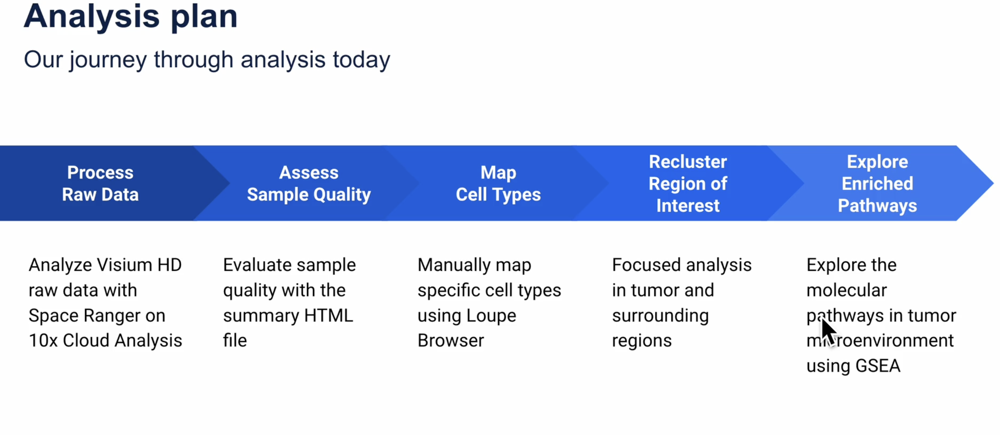

# Possible issues with Image Processing


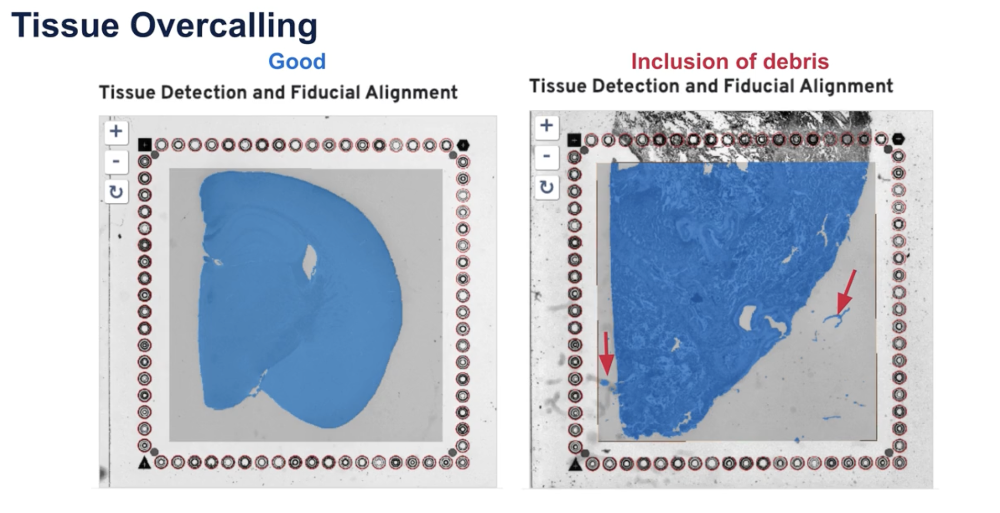

### Left panel – “Good” tissue detection
- The blue overlay correctly covers only the true tissue area.
- The algorithm accurately detects the tissue boundary without including background.
- Fiducial alignment (the red circles around the array) is proper.
- This image will produce accurate spatial gene expression data, because only spots overlapping real tissue are counted.

### Right panel – “Inclusion of debris” (Overcalling)
- The algorithm overcalls tissue, meaning it detects extra non-tissue material (blue region includes debris).
- Red arrows mark debris or smudges incorrectly classified as tissue.
- These debris regions don’t contain real cells or mRNA, but will still be treated as valid spots, adding false background expression and noise to downstream data.


In [1]:
# Sample Swap

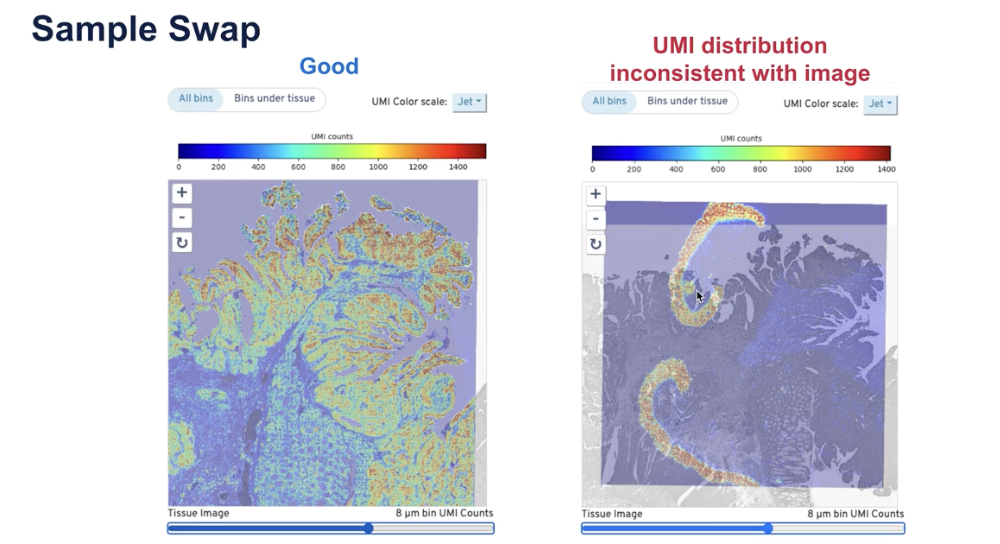

### Left panel — “Good” alignment (UMI distribution matches the tissue structure)
- The UMI heatmap (color-coded expression intensity) follows the tissue morphology.
- Regions with dense cells (epithelium, glands) have high UMI counts (yellow-red).
- Sparse or empty regions show low UMIs (blue/purple).
- Tissue boundaries and molecular signal coincide properly.
- This indicates the correct image and FASTQ pairing, the sample and spatial alignment are valid.

### Right panel — “UMI distribution inconsistent with image” (UMI distribution inconsistent with tissue — possible sample swap)
- The heatmap pattern doesn’t match the tissue morphology seen in the histology image.
- Areas of high UMI density (bright red) appear in regions with little or no tissue.
- Other regions with visible tissue have unexpectedly low UMI counts.
This mismatch strongly suggests:
 - The wrong H&E image was linked to this dataset, OR
 - The wrong sequencing library (FASTQ) was used for this image.
- Diagnostic clue: The UMI distribution should always mirror tissue density — when it doesn’t, something is mismatched.

# CytAssist To Microscope Image Alignment

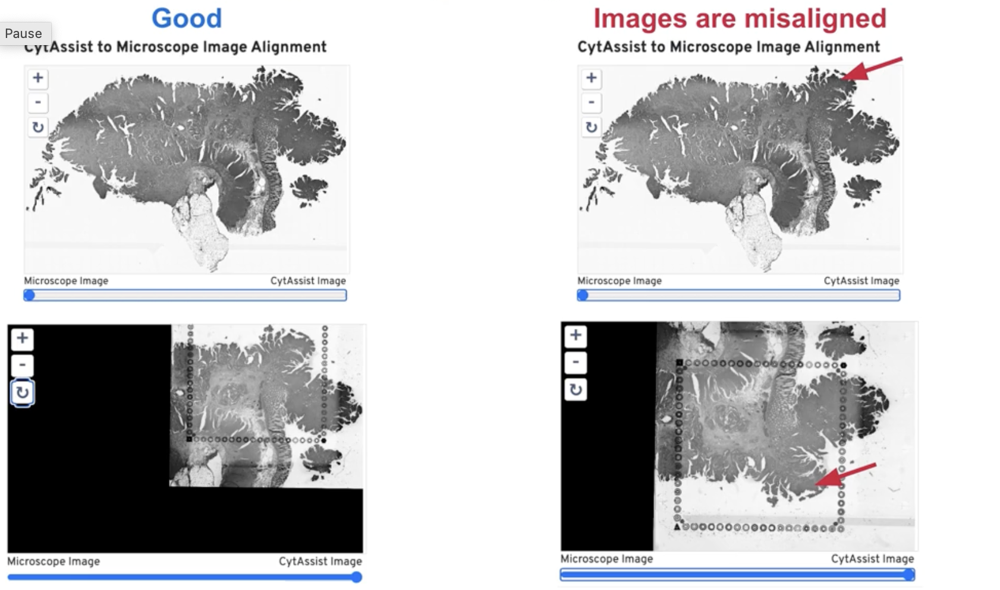

### Left panel — “Good” alignment
- Label: Good — CytAssist to microscope image alignment is correct.
- The two images (CytAssist image and microscope H&E image) perfectly overlap.
- When you slide the overlay bar between the two images, tissue structures (folds, glands, edges) line up exactly.
- Fiducial markers (the black circular spots around the array) are correctly aligned with the tissue boundaries.
- The capture area is in the correct position relative to the tissue.
- Spatial barcodes correspond accurately to the tissue features — gene expression data will map correctly to morphology.

### Right panel — “Images are misaligned”
- Label: Misalignment between CytAssist and microscope images.
- The microscope and CytAssist images don’t overlap correctly.
- Red arrows point to tissue features that are shifted or out of position.
- The fiducial marker frame (black dots) and the tissue outline don’t match.
- The tissue appears shifted upward or sideways relative to the capture area.

# Troubleshoot

We can use loupe browser to manually create the json files that can be used while setting the Visium HD analysis which overrides the automatic image processing. This can be performed on Loupe Broswer. 

# Python Analysis on Colon Cancer Visium HD dataset

In [2]:
#import libraries
import spatialdata as spd
import spatialdata_plot as splt
import spatialdata_io as so
import geosketch as sketch
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce

import json
import gc
import geopandas as gpd
from spatialdata.models import Image2DModel, TableModel, ShapesModel
import matplotlib.pyplot as plt

from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from PIL import Image
from spatialdata.transformations import Identity, Scale
from shapely.geometry import Polygon

/Users/sharmas30/spatialData/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/sharmas30/spatialData/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


# Helper Function

We use two custom helper function in this guide, which are defined in the next set of code cells.

The function create_zarr takes the raw output files from 10x Genomics' Visium HD processing and structures them into a single Zarr file, making the data ready for spatial analysis using libraries like spatialdata. It takes input paths, loads and prepares data, defines coordinate systems and transformations, processes the cell segmentation, integrates it with the AnnData object, creates SpatialData elements, and writes all of this to a Zarr file.

It takes five inputs:

- image_path: The path to the image file.
- count_matrix_path: The path to the cell segmentation filtered feature-barcode count matrix file.
- scale_factors_path: The path to the scale factors JSON file.
- geojson_path: The path to the cell segmentation GeoJSON file.
- sample_name: A name for the Zarr output file.

In this guide, we use the hires_image.png file to reduce the size of the Zarr file and the RAM requirement, which speeds up the code. The full-resolution microscope image can also be used, with adjustments to the code to properly scale the cell segmentation GeoJSON file. The images required in the final Zarr file will depend on the downstream analyses













In [3]:
def create_zarr(count_matrix_path,
                image_path,
                scale_factors_path,
                geojson_path,
                sample_name):
    print(sample_name)

    # Load and Prepare Raw Data
    # Define file paths
    COUNT_MATRIX_PATH = count_matrix_path
    IMAGE_PATH = image_path
    SCALE_FACTORS_PATH = scale_factors_path
    GEOJSON_PATH = geojson_path

    # Load AnnData
    adata = sc.read_10x_h5(COUNT_MATRIX_PATH)
    adata.var_names_make_unique()
    adata.obs['sample'] = sample_name
    adata.obs.index = sample_name +"_" + adata.obs.index.astype(str)

    # Load and preprocess image data
    image_data = np.array(Image.open(IMAGE_PATH))
    if image_data.ndim == 2:
        image_data = image_data[np.newaxis, :, :] # Add channel dimension for grayscale
    elif image_data.ndim == 3:
        image_data = np.transpose(image_data, (2, 0, 1)) # (H, W, C) -> (C, H, W) for spatialdata

    # Load scale factors
    with open(SCALE_FACTORS_PATH, 'r') as f:
        scale_data = json.load(f)

    # Load GeoJSON data
    with open(GEOJSON_PATH, 'r') as f:
        geojson_data = json.load(f)

    # Define coordinate systems:
    # `downscale_to_hires`: The coordinate system where shapes are located, scaled relative to the hires resolution.

    hires_scale = scale_data['tissue_hires_scalef']

    # Transformation for shapes (from pixel to downscale_to_hires)
    shapes_transformations = {
       "downscale_to_hires": Scale(np.array([hires_scale, hires_scale]), axes=("x", "y")) # if the high-resolution microscope image is being used and Identity() transform would be performed.
    }

    # Transformation for the 'hires_tissue_image' (it's already in the 'downscale_to_hires' space visually)
    image_transformations = {
        "downscale_to_hires": Identity()
    }

    # Process Cell Segmentation (GeoJSON) and Integrate with AnnData

    # Create a mapping from adata.obs.index to geojson features
    geojson_features_map = {
        f"{sample_name}_cellid_{feature['properties']['cell_id']:09d}-1": feature
        for feature in geojson_data['features']
    }

    # Prepare data for GeoDataFrame and update adata.obs
    geometries = []
    cell_ids_ordered = []

    for obs_index_str in adata.obs.index:
        feature = geojson_features_map.get(obs_index_str)
        if feature:
            # Create shapely Polygon from coordinates
            polygon_coords = np.array(feature['geometry']['coordinates'][0])
            geometries.append(Polygon(polygon_coords))
            cell_ids_ordered.append(obs_index_str)
        else:
            geometries.append(None) # Or a suitable placeholder
            cell_ids_ordered.append(obs_index_str)

    # Remove None entries if any (or handle them upstream)
    valid_indices = [i for i, geom in enumerate(geometries) if geom is not None]
    geometries = [geometries[i] for i in valid_indices]
    cell_ids_ordered = [cell_ids_ordered[i] for i in valid_indices]


    # Create GeoDataFrame for shapes
    shapes_gdf = gpd.GeoDataFrame({
        'cell_id': cell_ids_ordered,
        'geometry': geometries
    }, index=cell_ids_ordered)
    # Update adata.obs with cluster information and spatial identifiers
    adata.obs['cell_id'] = adata.obs.index
    adata.obs['region'] = sample_name + '_cell_boundaries'
    adata.obs['region'] = adata.obs['region'].astype('category')
    adata = adata[shapes_gdf.index].copy() # Filter adata to match shapes_gdf

    # Define names for SpatialData elements
    IMAGE_KEY =  sample_name + '_hires_tissue_image'
    TABLE_KEY =  'segmentation_counts'
    SHAPES_KEY = sample_name + '_cell_boundaries'

    # Create SpatialData elements directly
    sdata = spd.SpatialData(
        images={
            IMAGE_KEY: Image2DModel.parse(image_data, transformations=image_transformations)
        },
        tables={
            TABLE_KEY: TableModel.parse(
                adata,
                region=SHAPES_KEY, # Link table to shapes element
                region_key='region', # Column in adata.obs indicating region name
                instance_key='cell_id' # Column in adata.obs with instance IDs (cell_id)
            )
        },
        shapes={
            SHAPES_KEY: ShapesModel.parse(shapes_gdf, transformations=shapes_transformations)
        }
    )

    sdata.write(sample_name, overwrite=True)
    del sdata
    gc.collect()




The second helper function crop0 ensures that the images generated from the analysis are cropped to the region of interest, aligning with the Visium HD Capture Area of each sample. It takes as input a SpatialData object (x), a target coordinate system (crs), and a bounding box dictionary (bbox). A bounding box dictionary is a way to represent a rectangular region in a 2D space using a Python dictionary. It typically contains the minimum and maximum coordinates for both the x and y axes that define the boundaries of the box. The function assumes that the bbox dictionary was created using spd.get_extent with the same coordinate system. Internally, the function calls spd.bounding_box_query and uses the minimum and maximum coordinates from the dictionary to subset the data from the SpatialData object that falls within this defined rectangle. This ensures that subsequent visualizations or analyses are focused only on the relevant part of the data. This is required because the microscope image is often larger than the Visium HD Gene Expression capture area.

# Samples

The specific datasets used in this guide are:

- Visium HD, Sample P1 Colon Cancer (CRC): Human colon cancer tissue (Patient 1).
- Visium HD, Sample P2 CRC: Human colon cancer tissue (Patient 2).
- Visium HD, Sample P3 Normal Adjacent Tissue (NAT): Normal adjacent human colon tissue (Patient 3).
- Visium HD, Sample P5 NAT: Normal adjacent human colon tissue (Patient 5).

## Note
It's important to run the to generate the Space Ranger cell segmentation outputs used in this guide, the public colon cancer and normal adjacent tissue datasets were reprocessed using spaceranger count v4.0.1. which can run the cell segmentation algorithm.

 ## Conversion of Space Ranger Output to Zarr Format and SpatialData Object Creation


In [4]:
samples = {
    "Colon_Cancer_P1" : ["/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_filtered_feature_cell_matrix.h5",
                         "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_tissue_hires_image.png",
                         "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_scalefactors_json.json",
                         "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_cell_segmentations.geojson",
                         "Colon_Cancer_P1"],
    "Colon_Cancer_P2" : ["/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_filtered_feature_cell_matrix.h5",
                        "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_tissue_hires_image.png",
                        "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_scalefactors_json.json",
                        "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_cell_segmentations.geojson",
                        "Colon_Cancer_P2"],
    "Colon_Normal_P3" : ["/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P3_filtered_feature_cell_matrix.h5",
                        "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P3_tissue_hires_image.png",
                        "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P3_scalefactors_json.json",
                        "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P3_cell_segmentations.geojson",
                        "Colon_Normal_P3"],
    "Colon_Normal_P5" : ["/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P5_filtered_feature_cell_matrix.h5",
                         "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P5_tissue_hires_image.png",
                         "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P5_scalefactors_json.json",
                         "/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P5_cell_segmentations.geojson",
                         "Colon_Normal_P5"]
 }

In [5]:
print(samples)

{'Colon_Cancer_P1': ['/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_filtered_feature_cell_matrix.h5', '/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_tissue_hires_image.png', '/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_scalefactors_json.json', '/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P1_cell_segmentations.geojson', 'Colon_Cancer_P1'], 'Colon_Cancer_P2': ['/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_filtered_feature_cell_matrix.h5', '/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_tissue_hires_image.png', '/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_scalefactors_json.json', '/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Cancer_P2_cell_segmentations.geojson', 'Colon_Cancer_P2'], 'Colon_Normal_P3': ['/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P3_filtered_feature_cell_matrix.h5', '/Users/sharmas30/Desktop/Colon_cancer_visum_HD/data/Norm_P3_tissue_hires_

In [6]:
for key, inputs in samples.items():
    create_zarr(count_matrix_path = inputs[0],
                image_path = inputs[1],
                scale_factors_path = inputs[2],
                geojson_path = inputs[3],
                sample_name = inputs[4])
del samples, inputs, key
gc.collect()

Colon_Cancer_P1


/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
INFO     The Zarr backing store has been changed from None the new file path: Colon_Cancer_P1                      
Colon_Cancer_P2


/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
INFO     The Zarr backing store has been changed from None the new file path: Colon_Cancer_P2                      
Colon_Normal_P3


/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
INFO     The Zarr backing store has been changed from None the new file path: Colon_Normal_P3                      
Colon_Normal_P5


/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/sharmas30/spatialData/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
INFO     The Zarr backing store has been changed from None the new file path: Colon_Normal_P5                      


0

## Visium HD Spatial Data object

SpatialData object helps to unify the multiomic spatial dataset. It brings data into single unified SpatialData object. it typically has following components.
- Images: CytAssist/Microscopic images. These can be accessed as sdata.images
- Shapes: Geometric polygons or Region of Interest. These can be accessed using sdata.shapes
- Tables: AnnData object typically contains gene expression, cellular data, UMAP embeddings. These are accessible as sdata.tables

## Loading the zarr files

In [7]:
visium_hd_zarr_paths = {
    "Cancer_P1" : "./Colon_Cancer_P1",
    "Cancer_P2" : "./Colon_Cancer_P2",
    "Normal_P3" : "./Colon_Normal_P3",
    "Normal_P5" : "./Colon_Normal_P5"
}

In [8]:
visium_hd_zarr_paths

{'Cancer_P1': './Colon_Cancer_P1',
 'Cancer_P2': './Colon_Cancer_P2',
 'Normal_P3': './Colon_Normal_P3',
 'Normal_P5': './Colon_Normal_P5'}

In [9]:
# Loading samples into a dictionary
sdatas = []
for key, path in visium_hd_zarr_paths.items():
    sdata = spd.read_zarr(path)

    for table in sdata.tables.values():
        table.var_names_make_unique()
        table.obs["sample"] = key

    sdatas.append(sdata)
    del sdata, table
    gc.collect()
# Concatenate
concatenated_sdata = spd.concatenate(sdatas, concatenate_tables=True)

concatenated_sdata.write("concatenated_sdata", overwrite=True)

del concatenated_sdata,sdatas,visium_hd_zarr_paths, key, path
gc.collect()

concatenated_sdata = spd.read_zarr("concatenated_sdata")

print("---------------------------------")
print(concatenated_sdata)

version mismatch: detected: RasterFormatV02, requested: FormatV04
/Users/sharmas30/spatialData/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
version mismatch: detected: RasterFormatV02, requested: FormatV04
/Users/sharmas30/spatialData/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
version mismatch: detected: RasterFormatV02, requested: FormatV04
/Users/sharmas30/spatialData/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
version mismatch: detected: RasterFormatV02, requested: FormatV04
/Users/sharmas30/spatialData/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'r

INFO     The SpatialData object is not self-contained (i.e. it contains some elements that are Dask-backed from    
         locations outside concatenated_sdata). Please see the documentation of `is_self_contained()` to understand
         the implications of working with SpatialData objects that are not self-contained.                         
INFO     The Zarr backing store has been changed from None the new file path: concatenated_sdata                   


version mismatch: detected: RasterFormatV02, requested: FormatV04
/Users/sharmas30/spatialData/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
version mismatch: detected: RasterFormatV02, requested: FormatV04
version mismatch: detected: RasterFormatV02, requested: FormatV04
version mismatch: detected: RasterFormatV02, requested: FormatV04


---------------------------------
SpatialData object, with associated Zarr store: /Users/sharmas30/Desktop/concatenated_sdata
├── Images
│     ├── 'Colon_Cancer_P1_hires_tissue_image': DataArray[cyx] (3, 4961, 6000)
│     ├── 'Colon_Cancer_P2_hires_tissue_image': DataArray[cyx] (3, 3886, 6000)
│     ├── 'Colon_Normal_P3_hires_tissue_image': DataArray[cyx] (3, 3168, 6000)
│     └── 'Colon_Normal_P5_hires_tissue_image': DataArray[cyx] (3, 4153, 6000)
├── Shapes
│     ├── 'Colon_Cancer_P1_cell_boundaries': GeoDataFrame shape: (217952, 2) (2D shapes)
│     ├── 'Colon_Cancer_P2_cell_boundaries': GeoDataFrame shape: (220404, 2) (2D shapes)
│     ├── 'Colon_Normal_P3_cell_boundaries': GeoDataFrame shape: (75526, 2) (2D shapes)
│     └── 'Colon_Normal_P5_cell_boundaries': GeoDataFrame shape: (138374, 2) (2D shapes)
└── Tables
      └── 'segmentation_counts': AnnData (652256, 18085)
with coordinate systems:
    ▸ 'downscale_to_hires', with elements:
        Colon_Cancer_P1_hires_tissue_image (I

The concatenated SpatialData object (concatenated_sdata) contains:

four images (the hires_tissue_image.png for each sample), each with its corresponding coordinate system.
four shapes, which are GeoDataFrame representations of the cell segmentation bins.
one table that holds the cell segmentation bin gene expression data along with its metadata.
Using Sample P1 CRC as an example, the SpatialData object contains the following Elements:

Images:
Colon_Cancer_P1_hires_tissue_image: This is the high-resolution version of the downsampled PNG image, associated with the downscale_to_hires coordinate system.
Shapes:
Colon_Cancer_P1_cell_boundaries: This represents the spatial information (shape and location) for the cell segmentation bins.
Tables:
segmentation_counts: This table contains the gene expression data and associated metadata for the cell segmentation bins.
In this guide, the hires PNG images from the Visium HD output folder are used with the downscale_to_hires coordinate system. For more information on SpatialData objects, see scverse's introductory tutorials.

## Quality control and filtering

This analysis is done by removing low-quality cell segmentation bins from these datasets. This is done by visualising the total UMI distribution to estimate a suitable cutoff for sparsely empty bins. Note, even though mitochondrial content is calculated, it is not used as filtering criterion as high level of mitochondrial genes can be biologically relevant in spatial data.

In [10]:
print(concatenated_sdata)

SpatialData object, with associated Zarr store: /Users/sharmas30/Desktop/concatenated_sdata
├── Images
│     ├── 'Colon_Cancer_P1_hires_tissue_image': DataArray[cyx] (3, 4961, 6000)
│     ├── 'Colon_Cancer_P2_hires_tissue_image': DataArray[cyx] (3, 3886, 6000)
│     ├── 'Colon_Normal_P3_hires_tissue_image': DataArray[cyx] (3, 3168, 6000)
│     └── 'Colon_Normal_P5_hires_tissue_image': DataArray[cyx] (3, 4153, 6000)
├── Shapes
│     ├── 'Colon_Cancer_P1_cell_boundaries': GeoDataFrame shape: (217952, 2) (2D shapes)
│     ├── 'Colon_Cancer_P2_cell_boundaries': GeoDataFrame shape: (220404, 2) (2D shapes)
│     ├── 'Colon_Normal_P3_cell_boundaries': GeoDataFrame shape: (75526, 2) (2D shapes)
│     └── 'Colon_Normal_P5_cell_boundaries': GeoDataFrame shape: (138374, 2) (2D shapes)
└── Tables
      └── 'segmentation_counts': AnnData (652256, 18085)
with coordinate systems:
    ▸ 'downscale_to_hires', with elements:
        Colon_Cancer_P1_hires_tissue_image (Images), Colon_Cancer_P2_hires_tiss

In [11]:
adata = concatenated_sdata["segmentation_counts"]
adata

AnnData object with n_obs × n_vars = 652256 × 18085
    obs: 'sample', 'cell_id', 'region'
    uns: 'spatialdata_attrs'

In [12]:
# Add mitochondrial gene calculation for QC
print(adata.var)

Empty DataFrame
Columns: []
Index: [SAMD11, NOC2L, KLHL17, PLEKHN1, PERM1, HES4, ISG15, AGRN, RNF223, C1orf159, TTLL10, TNFRSF18, TNFRSF4, SDF4, B3GALT6, C1QTNF12, UBE2J2, SCNN1D, ACAP3, PUSL1, INTS11, CPTP, TAS1R3, DVL1, MXRA8, AURKAIP1, CCNL2, ANKRD65, TMEM88B, VWA1, ATAD3C, ATAD3B, ATAD3A, TMEM240, SSU72, FNDC10, MIB2, MMP23B, CDK11B, CDK11A, NADK, GNB1, CALML6, TMEM52, CFAP74, GABRD, PRKCZ, FAAP20, SKI, RER1, PEX10, PLCH2, PANK4, HES5, TNFRSF14, PRXL2B, MMEL1, ACTRT2, PRDM16, ARHGEF16, MEGF6, TPRG1L, WRAP73, TP73, CCDC27, SMIM1, LRRC47, CEP104, DFFB, C1orf174, AJAP1, NPHP4, KCNAB2, CHD5, RNF207, ICMT, GPR153, ACOT7, HES2, ESPN, TNFRSF25, PLEKHG5, NOL9, TAS1R1, ZBTB48, KLHL21, PHF13, THAP3, DNAJC11, CAMTA1, VAMP3, PER3, UTS2, TNFRSF9, ERRFI1, SLC45A1, RERE, ENO1, CA6, SLC2A7, ...]

[18085 rows x 0 columns]


In [13]:
print(adata.var)

Empty DataFrame
Columns: []
Index: [SAMD11, NOC2L, KLHL17, PLEKHN1, PERM1, HES4, ISG15, AGRN, RNF223, C1orf159, TTLL10, TNFRSF18, TNFRSF4, SDF4, B3GALT6, C1QTNF12, UBE2J2, SCNN1D, ACAP3, PUSL1, INTS11, CPTP, TAS1R3, DVL1, MXRA8, AURKAIP1, CCNL2, ANKRD65, TMEM88B, VWA1, ATAD3C, ATAD3B, ATAD3A, TMEM240, SSU72, FNDC10, MIB2, MMP23B, CDK11B, CDK11A, NADK, GNB1, CALML6, TMEM52, CFAP74, GABRD, PRKCZ, FAAP20, SKI, RER1, PEX10, PLCH2, PANK4, HES5, TNFRSF14, PRXL2B, MMEL1, ACTRT2, PRDM16, ARHGEF16, MEGF6, TPRG1L, WRAP73, TP73, CCDC27, SMIM1, LRRC47, CEP104, DFFB, C1orf174, AJAP1, NPHP4, KCNAB2, CHD5, RNF207, ICMT, GPR153, ACOT7, HES2, ESPN, TNFRSF25, PLEKHG5, NOL9, TAS1R1, ZBTB48, KLHL21, PHF13, THAP3, DNAJC11, CAMTA1, VAMP3, PER3, UTS2, TNFRSF9, ERRFI1, SLC45A1, RERE, ENO1, CA6, SLC2A7, ...]

[18085 rows x 0 columns]


In [14]:
adata.var["mt"] = adata.var_names.str.startswith("MT-", "mt-")

In [15]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True, percent_top=None)

In [16]:
adata.var

,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
SAMD11,False,2085,0.003304,0.003298,99.680340,2155.0,7.676010
NOC2L,False,10173,0.016057,0.015929,98.440336,10473.0,9.256651
KLHL17,False,3269,0.005076,0.005063,99.498816,3311.0,8.105308
PLEKHN1,False,3620,0.005720,0.005704,99.445003,3731.0,8.224700
PERM1,False,213,0.000330,0.000330,99.967344,215.0,5.375278
...,...,...,...,...,...,...,...
MT-ND4L,True,418796,3.357246,1.471840,35.792695,2189784.0,14.599314
MT-ND4,True,559904,11.826766,2.551534,14.158858,7714079.0,15.858558
MT-ND5,True,246429,0.735714,0.551419,62.218975,479874.0,13.081281
MT-ND6,True,269753,0.780919,0.577129,58.643079,509359.0,13.140910


In [ ]:
sc.pl.violin(adata=adata, keys=["log1p_total_counts"], stripplot=False, inner="box",show=False, groupby="sample",)
plt.title("Total UMI by Sample")
plt.axhline(y=4, color='r', linestyle='-')
plt.axhline(y=8, color='r', linestyle='-')
plt.title("Total UMI by Sample")
plt.show()

sc.pl.violin(adata=adata, keys=["log1p_n_genes_by_counts"], groupby="sample", stripplot=False, inner="box",show=False)
plt.title("Total Genes by Sample")
plt.show()

sc.pl.violin(adata=adata, keys=["log1p_total_counts_mt"], groupby="sample", stripplot=False, inner="box",show=False)
plt.title("Mitochondrial Genes by Sample")
plt.show()

plt.close('all')



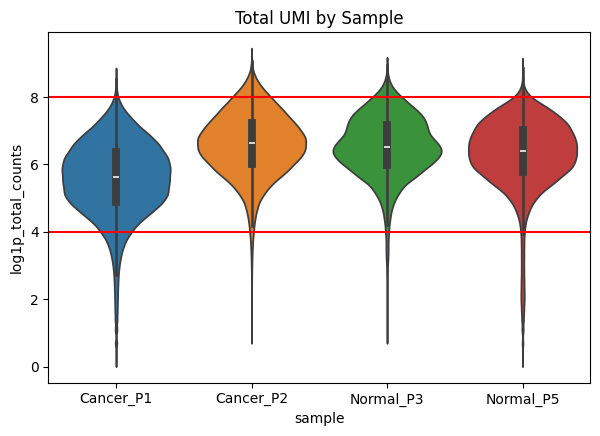

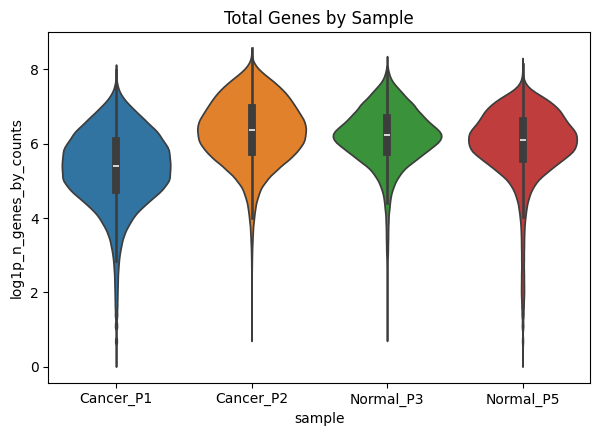

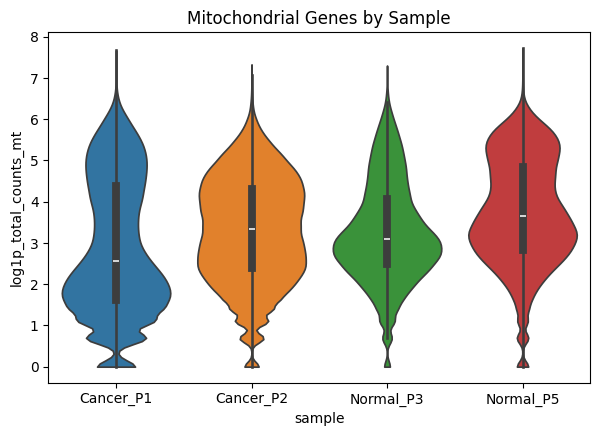

In [18]:
# Visualization for QC
sc.pl.violin(adata=adata, keys=["log1p_total_counts"], stripplot=False, inner="box",show=False, groupby="sample",)
plt.title("Total UMI by Sample")
plt.axhline(y=4, color='r', linestyle='-')
plt.axhline(y=8, color='r', linestyle='-')
plt.title("Total UMI by Sample")
plt.show()

sc.pl.violin(adata=adata, keys=["log1p_n_genes_by_counts"], groupby="sample", stripplot=False, inner="box",show=False)
plt.title("Total Genes by Sample")
plt.show()

sc.pl.violin(adata=adata, keys=["log1p_total_counts_mt"], groupby="sample", stripplot=False, inner="box",show=False)
plt.title("Mitochondrial Genes by Sample")
plt.show()

plt.close('all')



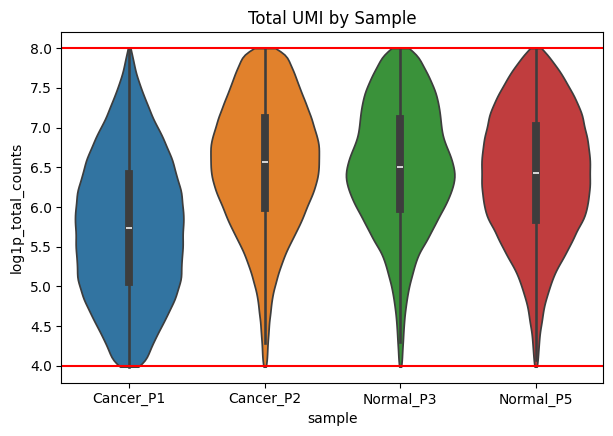

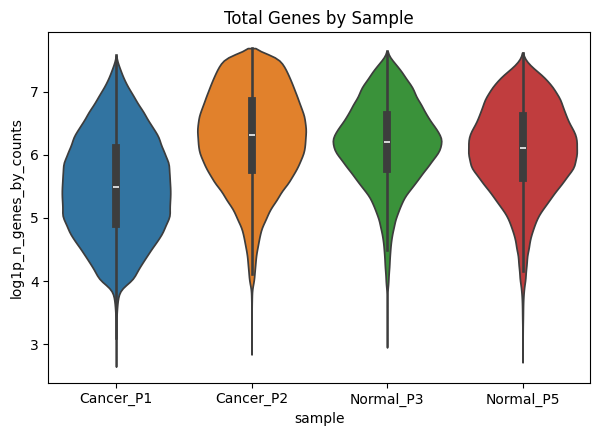

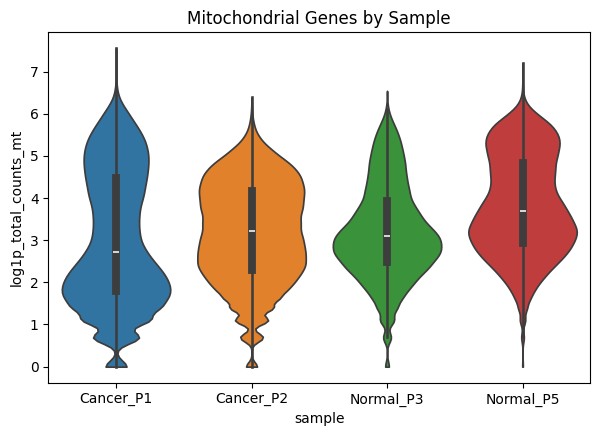

27303

In [20]:
# Estimating the cut off
min_counts = np.expm1(4).astype("int")
max_counts = np.expm1(8).astype("int")

# Filtering genes and cells
sc.pp.filter_genes(adata, min_cells=50)
sc.pp.filter_cells(adata, min_counts=min_counts)
sc.pp.filter_cells(adata, max_counts=max_counts)

# Visualization for QC
sc.pl.violin(adata=adata, keys=["log1p_total_counts"], stripplot=False, inner="box",show=False, groupby="sample",)
plt.title("Total UMI by Sample")
plt.axhline(y=4, color='r', linestyle='-')
plt.axhline(y=8, color='r', linestyle='-')
plt.title("Total UMI by Sample")
plt.show()

sc.pl.violin(adata=adata, keys=["log1p_n_genes_by_counts"], groupby="sample", stripplot=False, inner="box",show=False)
plt.title("Total Genes by Sample")
plt.show()

sc.pl.violin(adata=adata, keys=["log1p_total_counts_mt"], groupby="sample", stripplot=False, inner="box",show=False)
plt.title("Mitochondrial Genes by Sample")
plt.show()

plt.close('all')

# storing filtered counts
adata.layers["filtered_counts"] = adata.X.copy()


del max_counts, min_counts
gc.collect()

## Data Normalisation and Dimentionality reduction

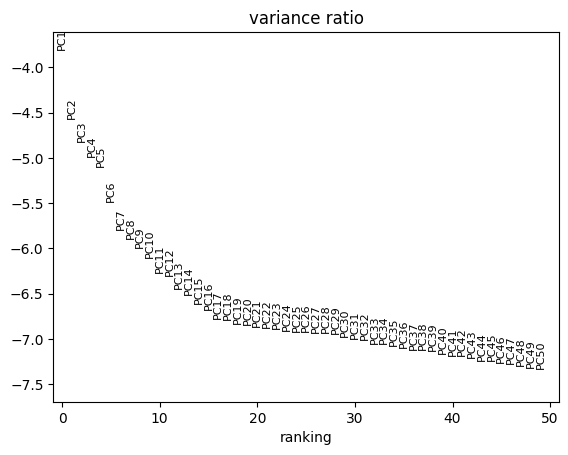

In [23]:
sc.pp.normalize_total(adata, target_sum = None)
sc.pp.log1p(adata)
sc.tl.pca(adata)

adata.write("preprocessed_adata.h5ad")

# Elbow plot
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=50)

## Clustering and UMAP visualization

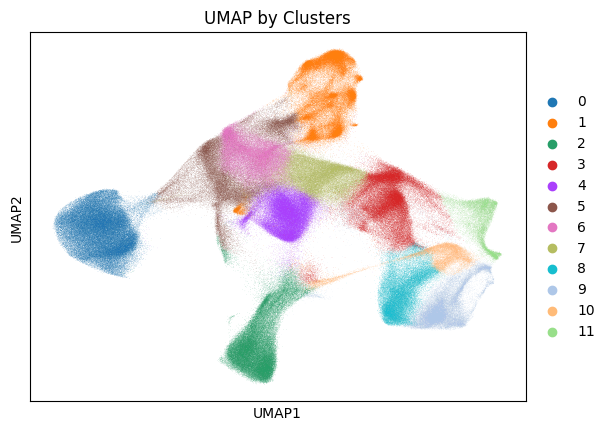

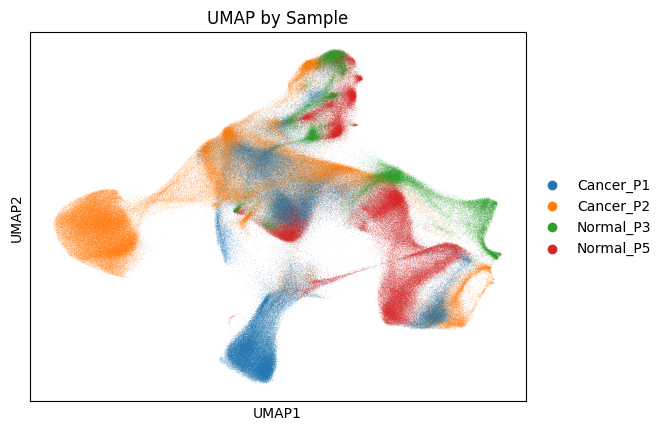

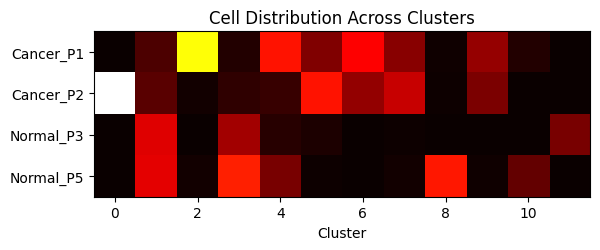

107189

In [25]:
# neighborhood and clustering resolution
RES = 0.5 # clustering resolution
NEIGHBORS = 30  # number of neighbors

MIN_DIST=0.5 #default 0.5
SPREAD=2 #default 1

sc.pp.neighbors(adata, n_neighbors=NEIGHBORS, use_rep="X_pca",metric="correlation")
sc.tl.leiden(adata, flavor="igraph", key_added="clusters", resolution=RES,random_state=0)

# To ensure that the results are reproducible we are going to reorder the clusters by size.
adata.obs['orig_clusters'] = adata.obs['clusters']

clusters = adata.obs['clusters'].astype(int)

# Count cells per cluster
cluster_sizes = clusters.value_counts().sort_values(ascending=False)

# Create mapping: old cluster ID → new ordered ID
cluster_order = {old: new for new, old in enumerate(cluster_sizes.index)}

# Relabel clusters in adata
adata.obs['clusters'] = clusters.map(cluster_order).astype(str)

# Set random_state for reproducible UMAP
sc.tl.umap(adata,min_dist=MIN_DIST, spread=SPREAD, random_state=0)

# Plot UMAP
sc.pl.umap(adata, color=["clusters"], title="UMAP by Clusters")
sc.pl.umap(adata, color=["sample"], title="UMAP by Sample")

# Cell distribution across clusters
sample_names = adata.obs["sample"].unique()
plt.imshow(pd.crosstab(adata.obs["sample"], adata.obs["clusters"]), cmap='hot', interpolation='nearest')
plt.title("Cell Distribution Across Clusters")
plt.xlabel("Cluster")
plt.yticks(range(len(sample_names)), sample_names)
plt.show()
plt.close('all')

del RES, NEIGHBORS, MIN_DIST, SPREAD
gc.collect()


## Batch Correction

2025-11-06 12:41:48,630 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-11-06 12:42:48,673 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-11-06 12:42:53,461 - harmonypy - INFO - Iteration 1 of 20
2025-11-06 12:46:36,069 - harmonypy - INFO - Iteration 2 of 20
2025-11-06 12:50:13,681 - harmonypy - INFO - Converged after 2 iterations


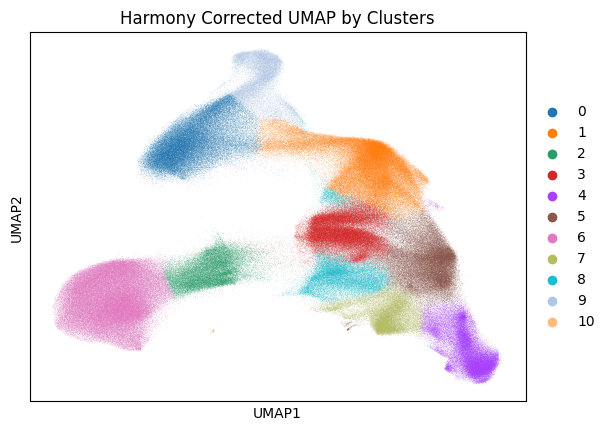

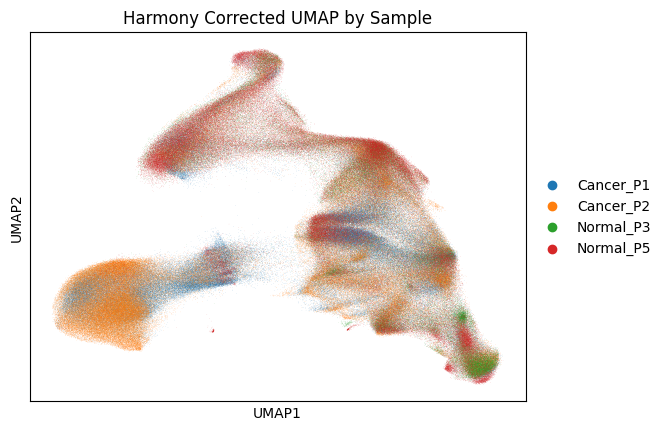

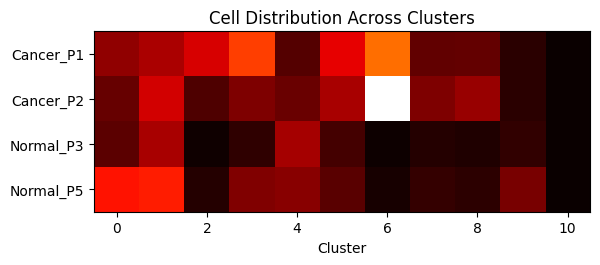

12399

In [27]:
# neighborhood and clustering resolution
RES = 0.5 # clustering resolution
NEIGHBORS = 30  # number of neighbors

MIN_DIST=0.5 #default 0.5
SPREAD=2 #default 1

# Performing batch correction
adata_harmony = concatenated_sdata["segmentation_counts"].copy()
sce.pp.harmony_integrate(adata_harmony, key="sample", basis="X_pca",max_iter_harmony=20)

# Copying the harmony PCA embedding results
adata_harmony.obsm["X_pca_orig"] = adata_harmony.obsm["X_pca"]
adata_harmony.obsm["X_pca"] = adata_harmony.obsm["X_pca_harmony"]
adata_harmony.obs["cluster_orig"] =  adata_harmony.obs["clusters"]

sc.pp.neighbors(adata_harmony, n_neighbors=NEIGHBORS, use_rep="X_pca",metric="correlation")
sc.tl.leiden(adata_harmony, flavor="igraph",key_added="harmony_clusters", resolution=RES,random_state=0)
adata_harmony.obs["clusters"] =  adata_harmony.obs["harmony_clusters"]

# Set random_state for reproducible UMAP
sc.tl.umap(adata_harmony,min_dist=MIN_DIST, spread=SPREAD, random_state=0)

# Plot UMAP
sc.pl.umap(adata_harmony, color=["clusters"], title="Harmony Corrected UMAP by Clusters")
sc.pl.umap(adata_harmony, color=["sample"], title="Harmony Corrected UMAP by Sample")

# Cell distribution across clusters
sample_names = adata_harmony.obs["sample"].unique()
plt.imshow(pd.crosstab(adata_harmony.obs["sample"], adata_harmony.obs["clusters"]), cmap='hot', interpolation='nearest')
plt.title("Cell Distribution Across Clusters")
plt.xlabel("Cluster")
plt.yticks(range(len(sample_names)), sample_names)
plt.show()
plt.close('all')


# If you want to use the harmony results in the analysis then overwrite the AnnData table in the SpatialData object by removing the comment below.
# concatenated_sdata["segmentation_counts"] = adata_harmony

del adata_harmony, RES, NEIGHBORS, MIN_DIST, SPREAD
gc.collect()

In [32]:
## Spatial Visualization of Clusters

In [35]:
def crop0(x,crs,bbox):
    return spd.bounding_box_query(
        x,
        min_coordinate=[bbox['x'][0], bbox['y'][0]],
        max_coordinate=[bbox['x'][1], bbox['y'][1]],
        axes=("x", "y"),
        target_coordinate_system=crs,
    )

Plotting: Colon_Cancer_P1_hires_tissue_image
INFO     Rasterizing image for faster rendering.                                                                   


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Cancer_P1_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
Plotting: Colon_Cancer_P2_hires_tissue_image


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Cancer_P2_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
Plotting: Colon_Normal_P3_hires_tissue_image


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Normal_P3_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
Plotting: Colon_Normal_P5_hires_tissue_image


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Normal_P5_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


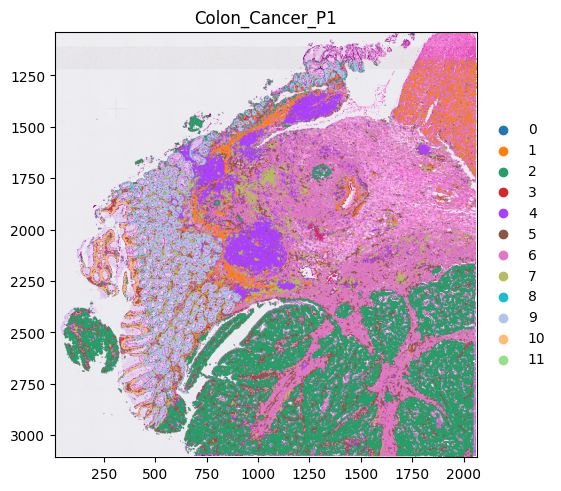

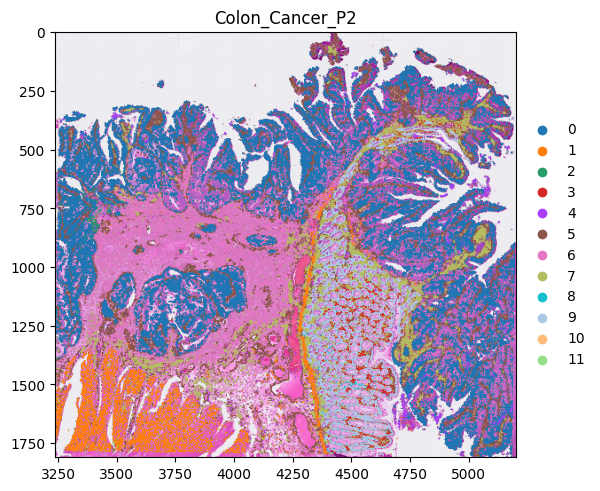

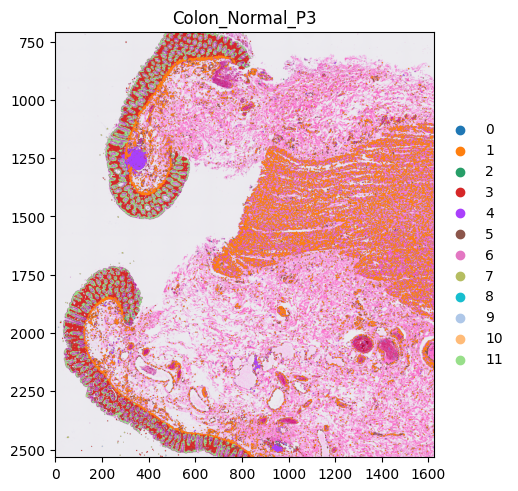

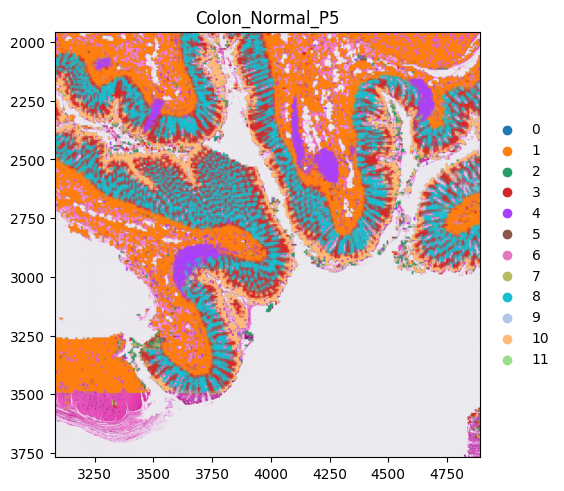

In [36]:
image_elements = list(concatenated_sdata.images.keys())
shape_elements = list(concatenated_sdata.shapes.keys())

# We are going to create a bounding box to crop the data to the capture area.
extents = []

for i in range(len(image_elements)):
    extent =  spd.get_extent(concatenated_sdata,elements=[shape_elements[i]],coordinate_system='downscale_to_hires')
    extents.append(extent)

# Plotting
if len(image_elements) != len(shape_elements):
    print("Check the spatial data to make sure that for every image there is a shape")
else:
    for i in range(len(image_elements)):
        print("Plotting: "+ image_elements[i])
        title=image_elements[i].replace("_hires_tissue_image","")
        crop0(concatenated_sdata,crs="downscale_to_hires",bbox=extents[i]).pl.render_images(image_elements[i]).pl.render_shapes(shape_elements[i],color="clusters").pl.show(coordinate_systems="downscale_to_hires", title=title)


## Marker Gene Identification

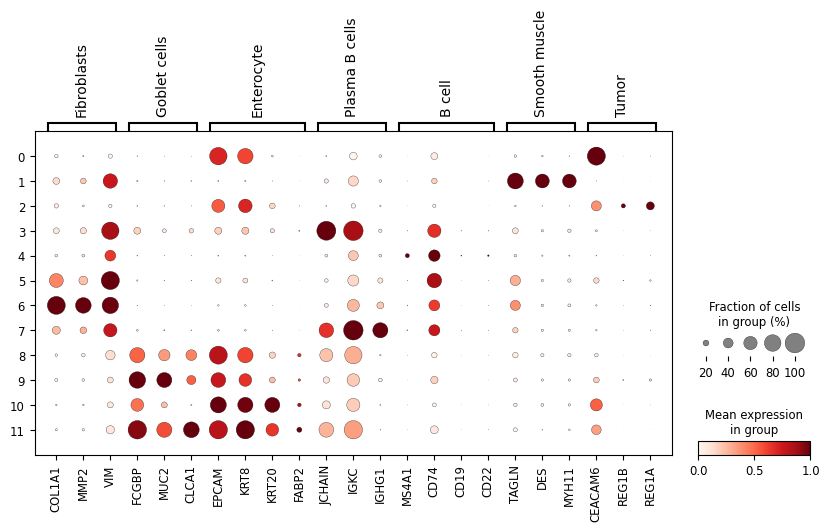

In [38]:
# cannonical markers for annotation
marker_genes = {
    "Fibroblasts": ["COL1A1", "MMP2", 'VIM'],
    "Goblet cells": ["FCGBP", "MUC2", "CLCA1"],
    "Enterocyte":["EPCAM","KRT8","KRT20","FABP2"],
    "Plasma B cells":['JCHAIN','IGKC','IGHG1'],
    "B cell":['MS4A1','CD74','CD19','CD22'],
    "Smooth muscle":['TAGLN','DES','MYH11'],
    "Tumor":["CEACAM6",'REG1B',"REG1A"]
}

# Plot dotplot for initial cluster assessment

sc.pl.dotplot(adata = concatenated_sdata["segmentation_counts"], var_names = marker_genes, groupby="clusters", standard_scale="var")



Plotting: Colon_Cancer_P1_hires_tissue_image
INFO     Rasterizing image for faster rendering.                                                                   


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Cancer_P1_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
Plotting: Colon_Cancer_P2_hires_tissue_image


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Cancer_P2_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
Plotting: Colon_Normal_P3_hires_tissue_image


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Normal_P3_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
Plotting: Colon_Normal_P5_hires_tissue_image


/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `Colon_Normal_P5_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sharmas30/spatialData/lib/python3.10/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


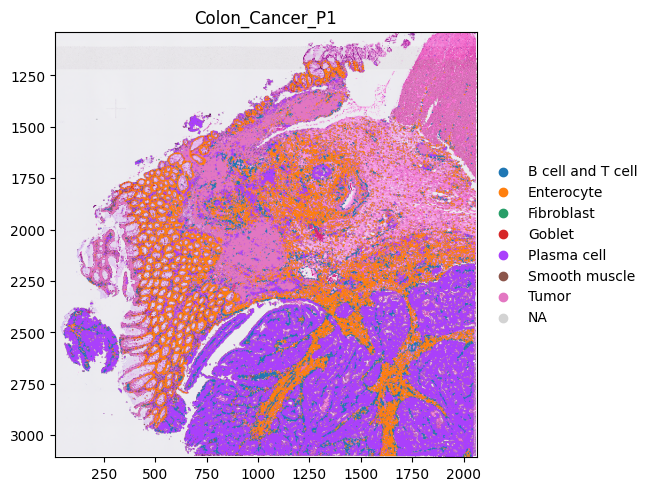

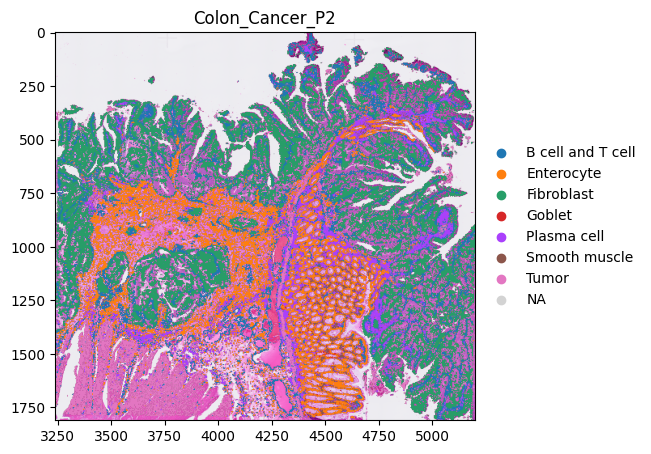

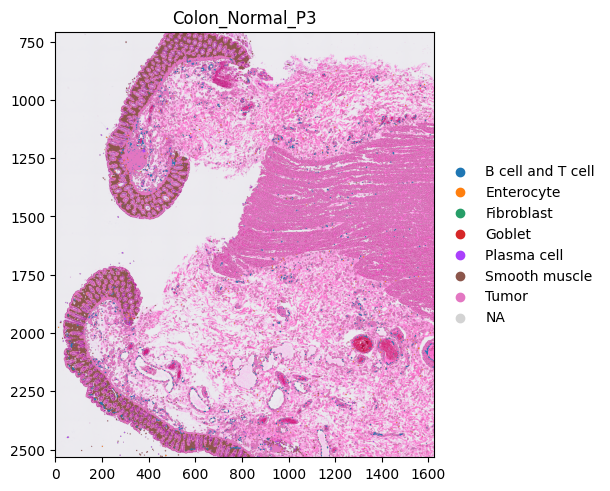

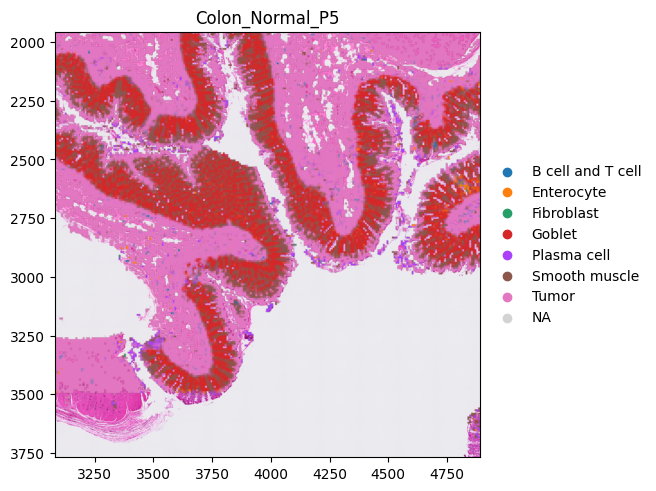

In [39]:
# Cluster annotation mapping
original_clusters = concatenated_sdata["segmentation_counts"].obs['clusters']

cell_annotation = {
    '0': 'Fibroblast',
    '1': 'Tumor',
    '2': 'Plasma cell',
    '3': 'Smooth muscle',
    '4': 'Tumor',
    '5': 'B cell and T cell',
    '6': 'Enterocyte',
    '7': 'Plasma cell',
    '8': 'Goblet',
    '9': 'Enterocyte'
}

# Apply the mapping. This new_categories Series should have the same index as original_clusters.
new_categories = original_clusters.astype('string').map(cell_annotation)

# Assign to sdata_concatenate.
concatenated_sdata["segmentation_counts"].obs["grouped_clusters"] = new_categories.astype('category')

# Plotting with new grouped clusters
for i in range(len(image_elements)):
  print("Plotting: "+ image_elements[i])
  title=image_elements[i].replace("_hires_tissue_image","")
  crop0(concatenated_sdata,crs="downscale_to_hires",bbox=extents[i]).pl.render_images(image_elements[i]).pl.render_shapes(shape_elements[i],color="grouped_clusters").pl.show(coordinate_systems="downscale_to_hires", title=title)

In [41]:
## Marker Gene Identification and Cluster Annotation

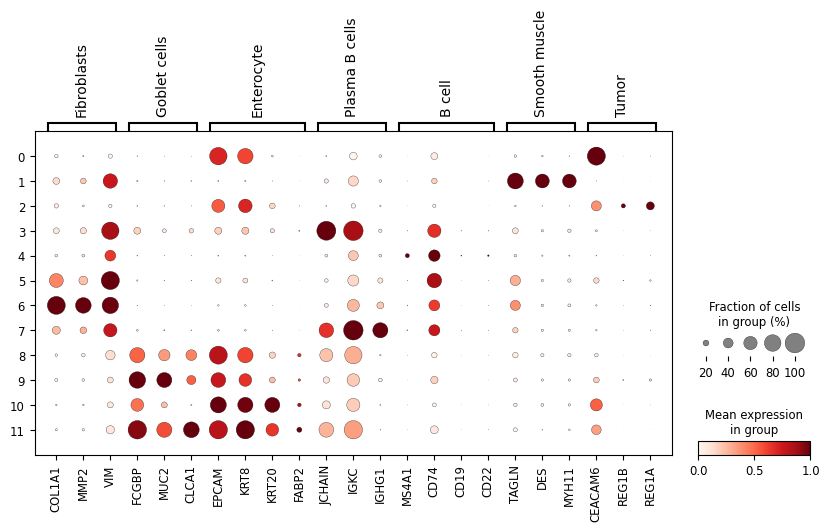

In [42]:
# cannonical markers for annotation
marker_genes = {
    "Fibroblasts": ["COL1A1", "MMP2", 'VIM'],
    "Goblet cells": ["FCGBP", "MUC2", "CLCA1"],
    "Enterocyte":["EPCAM","KRT8","KRT20","FABP2"],
    "Plasma B cells":['JCHAIN','IGKC','IGHG1'],
    "B cell":['MS4A1','CD74','CD19','CD22'],
    "Smooth muscle":['TAGLN','DES','MYH11'],
    "Tumor":["CEACAM6",'REG1B',"REG1A"]
}

# Plot dotplot for initial cluster assessment

sc.pl.dotplot(adata = concatenated_sdata["segmentation_counts"], var_names = marker_genes, groupby="clusters", standard_scale="var")


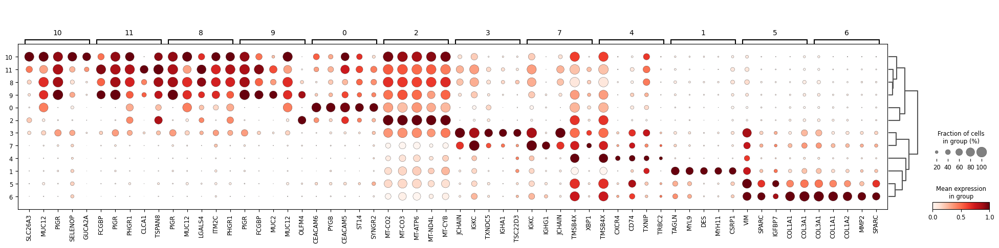

CPU times: user 16min 18s, sys: 7min 26s, total: 23min 45s
Wall time: 12min 52s


In [43]:
%%time

# Obtain cluster-specific marker genes
sc.tl.rank_genes_groups(adata = concatenated_sdata["segmentation_counts"], groupby="clusters", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata = concatenated_sdata["segmentation_counts"], groupby="clusters", standard_scale="var", n_genes=5)
df_marker_genes = sc.get.rank_genes_groups_df(adata = concatenated_sdata["segmentation_counts"],group = None,pval_cutoff=0.05)
df_marker_genes.to_csv("marker_genes_pval.csv")